<a href="https://colab.research.google.com/github/feranzie/Exploratory-and-Descriptive-analysis-/blob/main/Books_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import base64
import numpy as np
import pandas as pd

# Plotly imports
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

# Other imports
from pprint import pprint
from collections import Counter
# from scipy.misc import imread
from matplotlib import pyplot as plt
import matplotlib
%matplotlib inline
from os import path

import re
import seaborn as sns
##print "all imports worked nicely"
import string

#Load data 

In [ ]:
!unzip /content/datacopy.zip

Archive:  /content/datacopy.zip
   creating: datacopy/
  inflating: datacopy/10463.txt      
  inflating: datacopy/10464.txt      
  inflating: datacopy/10465.txt      
  inflating: datacopy/10466.txt      
  inflating: datacopy/10467.txt      
  inflating: datacopy/10468.txt      
  inflating: datacopy/10469.txt      
  inflating: datacopy/10470.txt      
  inflating: datacopy/10471.txt      
  inflating: datacopy/10472.txt      
  inflating: datacopy/10473.txt      
  inflating: datacopy/10474.txt      
  inflating: datacopy/10475.txt      
  inflating: datacopy/10476.txt      
  inflating: datacopy/10477.txt      
  inflating: datacopy/10478.txt      
  inflating: datacopy/10479.txt      
  inflating: datacopy/10482.txt      
  inflating: datacopy/10483.txt      
  inflating: datacopy/10484.txt      
  inflating: datacopy/10485.txt      
  inflating: datacopy/10486.txt      
  inflating: datacopy/10487.txt      
  inflating: datacopy/10488.txt      
  inflating: datacopy/10489.txt  

In [ ]:
# Import Module
import os

# Folder Path
path = "/content/datacopy"

# Change the directory
os.chdir(path)

# Read text File
txt=[]
text=[]
def read_text_file(file_path):
  with open(file_path, 'r') as f:
   i=(f.read())
   txt.append(i)

# iterate through all file
for file in os.listdir():
# Check whether file is in text format or not
  if file.endswith(".txt"):
    file_path = f"{path}/{file}"
    
# call read text file function
    read_text_file(file_path)

In [ ]:
''.join(txt[0])

'The Project Gutenberg EBook of Arthurian Chronicles: Roman de Brut, by Wace\n\nThis eBook is for the use of anyone anywhere at no cost and with\nalmost no restrictions whatsoever.  You may copy it, give it away or\nre-use it under the terms of the Project Gutenberg License included\nwith this eBook or online at www.gutenberg.org\n\n\nTitle: Arthurian Chronicles: Roman de Brut\n\nAuthor: Wace\n\nRelease Date: December 16, 2003 [EBook #10472]\n\nLanguage: English\n\nCharacter set encoding: ISO Latin-1\n\n*** START OF THIS PROJECT GUTENBERG EBOOK ARTHURIAN CHRONICLES: ROMAN ***\n\n\n\n\nProduced by Ted Garvin and PG Distributed Proofreaders\n\n\n\n\nARTHURIAN CHRONICLES: ROMAN DE BRUT\n\nby\n\nWACE\n\n\nTRANSLATED BY EUGENE MASON\n\n\n\n\nINTRODUCTION\n\n    "... In the chronicle of wasted time\n    I see descriptions of the fairest wights,\n    And beauty making beautiful old rhyme,\n    In praise of ladies dead and lovely knights."\n\n    SHAKESPEARE, Sonnet cvi.\n\n\nI.--WACE\n\nIn th

In [ ]:
#number of files
len(txt)

50

In [ ]:
res = []
for sub in txt:
  res.append(sub.replace("\n", " "))

In [ ]:
res

['The Project Gutenberg EBook of Arthurian Chronicles: Roman de Brut, by Wace  This eBook is for the use of anyone anywhere at no cost and with almost no restrictions whatsoever.  You may copy it, give it away or re-use it under the terms of the Project Gutenberg License included with this eBook or online at www.gutenberg.org   Title: Arthurian Chronicles: Roman de Brut  Author: Wace  Release Date: December 16, 2003 [EBook #10472]  Language: English  Character set encoding: ISO Latin-1  *** START OF THIS PROJECT GUTENBERG EBOOK ARTHURIAN CHRONICLES: ROMAN ***     Produced by Ted Garvin and PG Distributed Proofreaders     ARTHURIAN CHRONICLES: ROMAN DE BRUT  by  WACE   TRANSLATED BY EUGENE MASON     INTRODUCTION      "... In the chronicle of wasted time     I see descriptions of the fairest wights,     And beauty making beautiful old rhyme,     In praise of ladies dead and lovely knights."      SHAKESPEARE, Sonnet cvi.   I.--WACE  In the long line of Arthurian chroniclers Geoffrey of Mo

# Feature Extraction

In [ ]:
#grab content
content=[]
for i in res:
  try:
    c=re.search(r'START OF(.*?)END', i).group(1)
    content.append(c)
#  except Exception:  
#    b=re.search(r'CONTENT(.*?)END OF', i).group(1)
#    content.append(b)
  except Exception:  
    content.append('null')


In [ ]:
zb=[]
for i in content:
  zb.append( i=='null')


In [ ]:
zb

[False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False]

In [ ]:
#get number of chapters per book
chapterz=[]
for i in txt:
  import re
  chapters = re.split("Chapter ", i, flags = re.IGNORECASE) #Finds all the chapter markers in the book and makes a list of all the chapters
  chapters.pop(0) # Removes the first item in list as this is ""
  chapterz.append(len(chapters))

In [ ]:
chapterz

[1,
 61,
 4,
 16,
 0,
 0,
 0,
 2,
 13,
 0,
 9,
 1,
 0,
 0,
 1,
 0,
 19,
 1,
 51,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 8,
 1,
 19,
 0,
 32,
 22,
 19,
 0,
 0,
 21,
 6,
 0,
 0,
 0,
 0,
 0,
 21,
 5,
 0,
 0,
 0,
 24,
 27]

In [ ]:
#grab title
title=[]
for i in res:
  c=re.search(r'Title:(.*?)Author', i).group(1)
  title.append(c)



In [ ]:
title

[' Arthurian Chronicles: Roman de Brut  ',
 ' The Bars of Iron  ',
 ' Practice Book  ',
 ' Short Stories Old and New  ',
 " Audio: Delia's Gone  ",
 ' On the Seashore  ',
 ' Alcestis  ',
 ' Beacon Lights of History, Volume I  ',
 " Mercy Philbrick's Choice  ",
 ' Audio: Twelve Gates to the City  ',
 " A Child's Anti-Slavery Book        Containing a Few Words About American Slave Children and Stories        of Slave-Life.  ",
 ' The Mirror of Literature, Amusement, and Instruction, Vol. 12, Issue 326, August 9, 1828  ',
 ' Audio: John Henry  ',
 ' Audio: Liverpool Gals  ',
 ' Little Saint Elizabeth and Other Stories   ',
 ' Audio: Nine Hundred Miles  ',
 ' The Primadonna  ',
 ' Under King Constantine  ',
 ' The Young Mother        Management of Children in Regard to Health  ',
 ' Audio: Battle Hymn of the Republic  ',
 ' Bits About Home Matters  ',
 ' A Select Collection of Old English Plays, Vol. VIII (4th edition)  ',
 ' The Golden Legend  ',
 ' Audio: Waltzing Matilda  ',
 ' The Comp

In [ ]:
#grab author
author=[]
for i in res:
  c=re.search(r'Author:(.*?)Release', i).group(1)
  author.append(c)

In [ ]:
author

[' Wace  ',
 ' Ethel May Dell  ',
 ' Leland Powers  ',
 ' Selected and Edited by C. Alphonso Smith  ',
 ' Roger McGuinn  ',
 ' R. Cadwallader Smith  ',
 ' Euripides  ',
 ' John Lord  ',
 ' Helen Hunt Jackson  ',
 ' Roger McGuinn  ',
 ' Various  ',
 ' Various  ',
 ' Roger McGuinn  ',
 ' Roger McGuinn  ',
 ' Frances Hodgson Burnett  ',
 ' Roger McGuinn  ',
 ' F. Marion Crawford  ',
 ' Katrina Trask  ',
 ' William A. Alcott  ',
 ' Roger McGuinn  ',
 ' Helen Hunt Jackson  ',
 ' Various  ',
 ' Henry Wadsworth Longfellow  ',
 ' Roger McGuinn  ',
 ' Anonymous, given as "W. M."  ',
 ' Atticus  ',
 ' Various  ',
 ' Edited by Professor Arber and Thomas Seccombe  ',
 ' John Lord  ',
 ' Ethel Cook Eliot  ',
 ' John Hay  ',
 ' William Patterson White  ',
 ' Mrs. J. R. Green  ',
 ' Bennet Copplestone  ',
 ' Roger McGuinn  ',
 " Pat O'Cotter  ",
 ' Kenneth McGaffey  ',
 ' John Lord  ',
 ' William Jefferson Clinton  ',
 ' Roger McGuinn  ',
 ' Roger McGuinn  ',
 ' Roger McGuinn  ',
 ' L. Leslie Brooke 

In [ ]:
date=[]
for i in res:
  c=re.search(r'Release Date: (.*?)Language', i).group(1)
  date.append(c)

In [ ]:
date[0]

'December 16, 2003 [EBook #10472]  '

In [ ]:
edit = []
for sub in date:
  edit.append(sub.replace("[", " )").replace(",", " ("))



In [ ]:
year=[]
import re
for i in edit:
  pattern = r"\( +(\w+)"
  results = re.findall(pattern, i)
  year.append(results)

In [ ]:
for i in range(len(year)):
  try:
    del year[i][1]
  except:
    continue


In [ ]:
year

[['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2008'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003'],
 ['2003']]

In [ ]:
years=[]
for i in year:
  for b in i:
    years.append(int(b))

In [ ]:
res[0]

'The Project Gutenberg EBook of Arthurian Chronicles: Roman de Brut, by Wace  This eBook is for the use of anyone anywhere at no cost and with almost no restrictions whatsoever.  You may copy it, give it away or re-use it under the terms of the Project Gutenberg License included with this eBook or online at www.gutenberg.org   Title: Arthurian Chronicles: Roman de Brut  Author: Wace  Release Date: December 16, 2003 [EBook #10472]  Language: English  Character set encoding: ISO Latin-1  *** START OF THIS PROJECT GUTENBERG EBOOK ARTHURIAN CHRONICLES: ROMAN ***     Produced by Ted Garvin and PG Distributed Proofreaders     ARTHURIAN CHRONICLES: ROMAN DE BRUT  by  WACE   TRANSLATED BY EUGENE MASON     INTRODUCTION      "... In the chronicle of wasted time     I see descriptions of the fairest wights,     And beauty making beautiful old rhyme,     In praise of ladies dead and lovely knights."      SHAKESPEARE, Sonnet cvi.   I.--WACE  In the long line of Arthurian chroniclers Geoffrey of Mon

In [ ]:
df = pd.DataFrame(
    {'title': title,
     'number of chapters': chapterz,
     'Author':author,
     'Publication year':years,
    'content':content
    })

In [ ]:
df.head()

,title,number of chapters,Author,Publication year,content
0,Arthurian Chronicles: Roman de Brut,1,Wace,2003,THIS PROJECT GUTENBERG EBOOK ARTHURIAN CHRONI...
1,The Bars of Iron,61,Ethel May Dell,2003,THE PROJECT GUTENBERG EBOOK THE BARS OF IRON*...
2,Practice Book,4,Leland Powers,2003,THIS PROJECT GUTENBERG EBOOK PRACTICE BOOK **...
3,Short Stories Old and New,16,Selected and Edited by C. Alphonso Smith,2003,THIS PROJECT GUTENBERG EBOOK SHORT STORIES OL...
4,Audio: Delia's Gone,0,Roger McGuinn,2003,THE PROJECT GUTENBERG EBOOK AUDIO: DELIA'S GO...


In [ ]:
#Removing punctuation, lowercasing words, digits and word containing digits
df['cleaned']=df['content'].apply(lambda x: x.lower())
df['cleaned']=df['cleaned'].apply(lambda x: re.sub('\w*\d\w*','', x))
df['cleaned']=df['cleaned'].apply(lambda x: re.sub('\n','', x))
df['cleaned']=df['cleaned'].apply(lambda x: re.sub(' +',' ',x))



In [ ]:
len(df['cleaned'][1])

586

In [ ]:
#nmber of missing values
len(df[df['number of chapters']==0]['number of chapters'])

24

In [ ]:
#type of features
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   title               50 non-null     object
 1   number of chapters  50 non-null     int64 
 2   Author              50 non-null     object
 3   Publication year    50 non-null     int64 
 4   content             50 non-null     object
 5   cleaned             50 non-null     object
dtypes: int64(2), object(4)
memory usage: 2.5+ KB


In [ ]:
word_no=[]
for i in df['cleaned']:
  import re
  words = len(re.findall(r'\w+', i))
  word_no.append(words)

In [ ]:
len(word_no)

50

In [ ]:
df['word count']=word_no

In [ ]:
#number of features
df.drop('content', inplace=True, axis=1)
len(df.columns)

6

In [ ]:
df.head()

,title,number of chapters,Author,Publication year,cleaned,word count
0,Arthurian Chronicles: Roman de Brut,1,Wace,2003,this project gutenberg ebook arthurian chroni...,59889
1,The Bars of Iron,61,Ethel May Dell,2003,the project gutenberg ebook the bars of iron*...,105
2,Practice Book,4,Leland Powers,2003,this project gutenberg ebook practice book **...,20113
3,Short Stories Old and New,16,Selected and Edited by C. Alphonso Smith,2003,this project gutenberg ebook short stories ol...,559
4,Audio: Delia's Gone,0,Roger McGuinn,2003,the project gutenberg ebook audio: delia's go...,137


# Exploratory Analysis

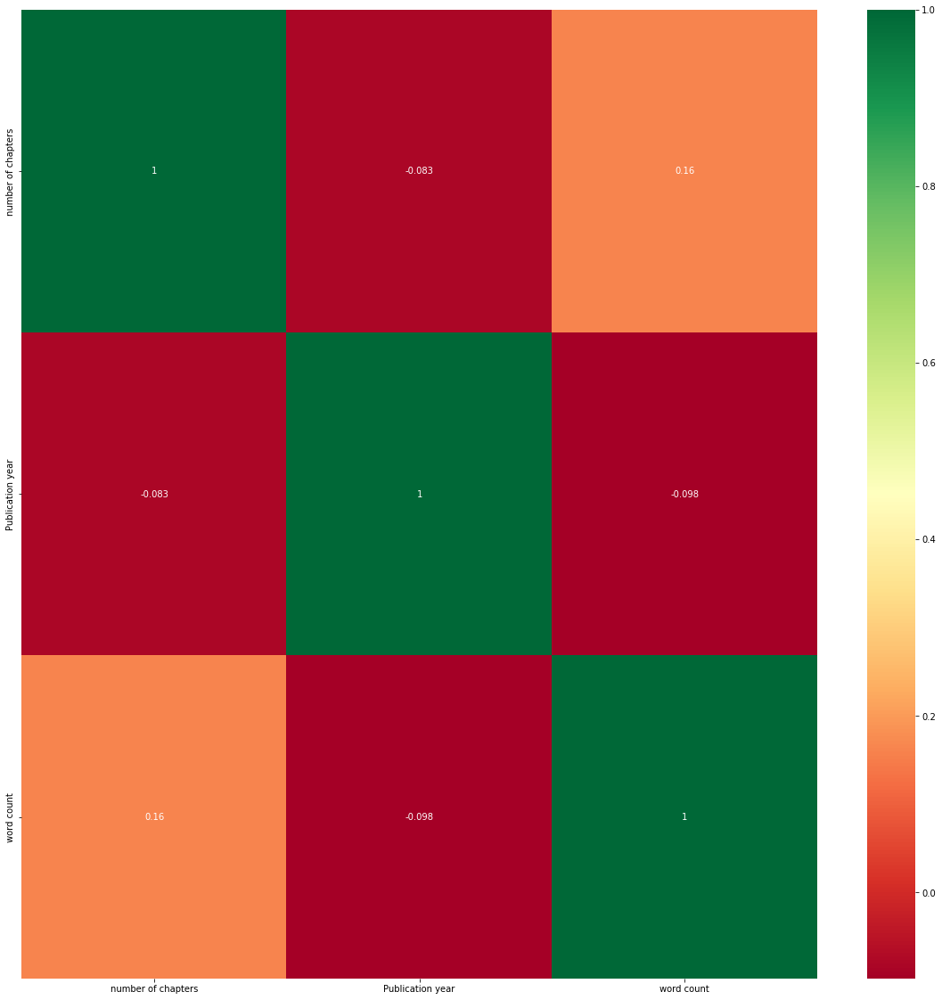

In [ ]:
## Correlation
import seaborn as sns
import matplotlib.pyplot as plt
#get correlations of each features in dataset
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(df[top_corr_features].corr(),annot=True,cmap="RdYlGn")

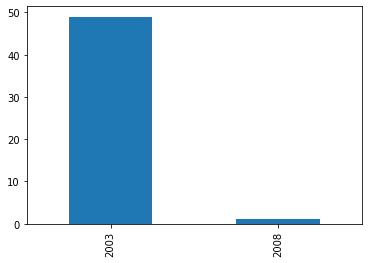

In [ ]:
#bar chart of publication year
df['Publication year'].value_counts().plot(kind='bar')

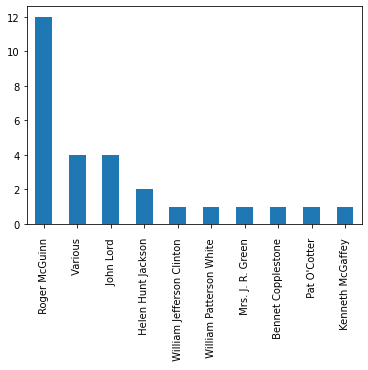

In [ ]:
#bar chart of top 10 authors with the most books
df['Author'].value_counts()[:10].plot(kind='bar')

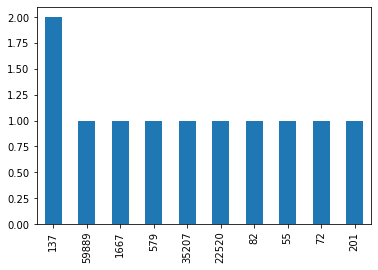

In [ ]:
#bar chart showing distribution of word count
df['word count'].value_counts()[:10].plot(kind='bar')

In [ ]:
topf=df.nlargest(5, ['word count'])

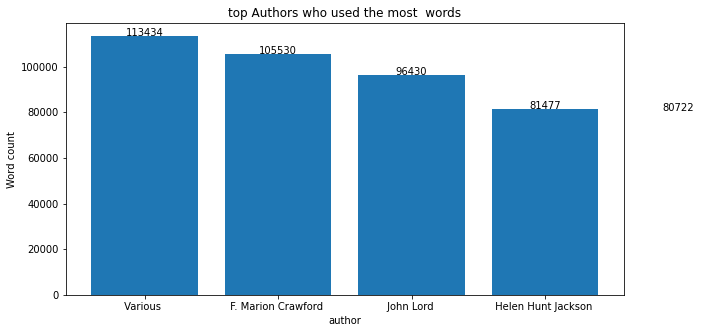

In [ ]:
def addlabels(x,y):
    for i in range(len(x)):
        plt.text(i, y[i], y[i], ha = 'center')
  
if __name__ == '__main__':
    
    # creating data on which bar chart will be plot
    x = list(topf['Author'].values)
    y = list(topf["word count"].values)
      
    # setting figure size by using figure() function 
    plt.figure(figsize = (10, 5))
      
    # making the bar chart on the data
    plt.bar(x, y)
      
    # calling the function to add value labels
    addlabels(x, y)
      
    # giving title to the plot
    plt.title("top Authors who used the most  words")
      
    # giving X and Y labels
    plt.xlabel("author")
    plt.ylabel("Word count")
      
    # visualizing the plot
    plt.show()